# Forest Cover Type Prediction

## PROBLEM STATEMENT
1 Prepare a complete data analysis report of the given data

2 Create a predictive model which helps to predict seven different cover types in 4 different wilderness areas of the forest with the best accuracy

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from scipy import stats
import warnings
warnings.filterwarnings('ignore')
from ydata_profiling import ProfileReport


In [2]:
data= pd.read_csv('forest_cover.csv')

In [3]:
data

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,1,2596,51,3,258,0,510,221,232,148,...,0,0,0,0,0,0,0,0,0,5
1,2,2590,56,2,212,-6,390,220,235,151,...,0,0,0,0,0,0,0,0,0,5
2,3,2804,139,9,268,65,3180,234,238,135,...,0,0,0,0,0,0,0,0,0,2
3,4,2785,155,18,242,118,3090,238,238,122,...,0,0,0,0,0,0,0,0,0,2
4,5,2595,45,2,153,-1,391,220,234,150,...,0,0,0,0,0,0,0,0,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15115,15116,2607,243,23,258,7,660,170,251,214,...,0,0,0,0,0,0,0,0,0,3
15116,15117,2603,121,19,633,195,618,249,221,91,...,0,0,0,0,0,0,0,0,0,3
15117,15118,2492,134,25,365,117,335,250,220,83,...,0,0,0,0,0,0,0,0,0,3
15118,15119,2487,167,28,218,101,242,229,237,119,...,0,0,0,0,0,0,0,0,0,3


In [4]:
data.head(pd.set_option('display.max_columns',None))#to diplay all columns from dataset

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,1,2596,51,3,258,0,510,221,232,148,6279,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
1,2,2590,56,2,212,-6,390,220,235,151,6225,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
2,3,2804,139,9,268,65,3180,234,238,135,6121,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2
3,4,2785,155,18,242,118,3090,238,238,122,6211,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2
4,5,2595,45,2,153,-1,391,220,234,150,6172,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15115,15116,2607,243,23,258,7,660,170,251,214,1282,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3
15116,15117,2603,121,19,633,195,618,249,221,91,1325,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3
15117,15118,2492,134,25,365,117,335,250,220,83,1187,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3
15118,15119,2487,167,28,218,101,242,229,237,119,932,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3


# Domian Analysis : Forest Cover Type Dataset 

### The dataset is about Forest Cover Type Prediction dataset.This is commonly used in machine learning for Classification tasks.

# Features:

#### Elevation - Elevation in meters

#### Aspect - Aspect in degrees azimuth

#### Slope - Slope in degrees

#### Horizontal_Distance_To_Hydrology - Horz Dist to nearest surface water features

#### Vertical_Distance_To_Hydrology - Vert Dist to nearest surface water features

#### Horizontal_Distance_To_Roadways - Horz Dist to nearest roadway

#### Hillshade_9am (0 to 255 index) - Hillshade index at 9am, summer solstice

#### Hillshade_Noon (0 to 255 index) - Hillshade index at noon, summer solstice

#### Hillshade_3pm (0 to 255 index) - Hillshade index at 3pm, summer solstice

#### Horizontal_Distance_To_Fire_Points - Horz Dist to nearest wildfire ignition points

#### Wilderness_Area (4 binary columns, 0 = absence or 1 = presence) - Wilderness area designation

#### Soil_Type (40 binary columns, 0 = absence or 1 = presence) - Soil Type designation

#### Cover_Type (7 types, integers 1 to 7) - Forest Cover Type designation

## BASIC CHECKS

In [5]:
data.head()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,1,2596,51,3,258,0,510,221,232,148,6279,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
1,2,2590,56,2,212,-6,390,220,235,151,6225,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
2,3,2804,139,9,268,65,3180,234,238,135,6121,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2
3,4,2785,155,18,242,118,3090,238,238,122,6211,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2
4,5,2595,45,2,153,-1,391,220,234,150,6172,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5


In [6]:
data.shape

(15120, 56)

In [7]:
data.tail()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
15115,15116,2607,243,23,258,7,660,170,251,214,1282,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3
15116,15117,2603,121,19,633,195,618,249,221,91,1325,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3
15117,15118,2492,134,25,365,117,335,250,220,83,1187,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3
15118,15119,2487,167,28,218,101,242,229,237,119,932,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3
15119,15120,2475,197,34,319,78,270,189,244,164,914,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15120 entries, 0 to 15119
Data columns (total 56 columns):
 #   Column                              Non-Null Count  Dtype
---  ------                              --------------  -----
 0   Id                                  15120 non-null  int64
 1   Elevation                           15120 non-null  int64
 2   Aspect                              15120 non-null  int64
 3   Slope                               15120 non-null  int64
 4   Horizontal_Distance_To_Hydrology    15120 non-null  int64
 5   Vertical_Distance_To_Hydrology      15120 non-null  int64
 6   Horizontal_Distance_To_Roadways     15120 non-null  int64
 7   Hillshade_9am                       15120 non-null  int64
 8   Hillshade_Noon                      15120 non-null  int64
 9   Hillshade_3pm                       15120 non-null  int64
 10  Horizontal_Distance_To_Fire_Points  15120 non-null  int64
 11  Wilderness_Area1                    15120 non-null  int64
 12  Wild

 1) There are total 15120 rows and 56 columns in this dataset
                                           

  2. No missing values are present in the dataset, as all columns have the same number         of non-null entries 


  3) The Cover_Type column is the target variable for a classification problem.   

  4. The datatype is in the same form uniformly i.e in integer form

In [9]:
data.describe()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
count,15120.00000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.0,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.0,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000
mean,7560.50000,2749.322553,156.676653,16.501587,227.195701,51.076521,1714.023214,212.704299,218.965608,135.091997,1511.147288,0.237897,0.033003,0.419907,0.309193,0.023479,0.041204,0.063624,0.055754,0.010913,0.042989,0.0,0.000066,0.000661,0.141667,0.026852,0.015013,0.031481,0.011177,0.0,0.007540,0.040476,0.003968,0.003042,0.009193,0.001058,0.022817,0.050066,0.016997,0.000066,0.003571,0.000992,0.000595,0.085384,0.047950,0.021958,0.045635,0.040741,0.001455,0.006746,0.000661,0.002249,0.048148,0.043452,0.030357,4.000000
std,4364.91237,417.678187,110.085801,8.453927,210.075296,61.239406,1325.066358,30.561287,22.801966,45.895189,1099.936493,0.425810,0.178649,0.493560,0.462176,0.151424,0.198768,0.244091,0.229454,0.103896,0.202840,0.0,0.008133,0.025710,0.348719,0.161656,0.121609,0.174621,0.105133,0.0,0.086506,0.197080,0.062871,0.055075,0.095442,0.032514,0.149326,0.218089,0.129265,0.008133,0.059657,0.031482,0.024391,0.279461,0.213667,0.146550,0.208699,0.197696,0.038118,0.081859,0.025710,0.047368,0.214086,0.203880,0.171574,2.000066
min,1.00000,1863.000000,0.000000,0.000000,0.000000,-146.000000,0.000000,0.000000,99.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,3780.75000,2376.000000,65.000000,10.000000,67.000000,5.000000,764.000000,196.000000,207.000000,106.000000,730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
50%,7560.50000,2752.000000,126.000000,15.000000,180.000000,32.000000,1316.000000,220.000000,223.000000,138.000000,1256.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0

In [10]:
data.shape

(15120, 56)

# Exploratory Data Analysis (EDA)¶

### Univariate Analysis¶

In [11]:
data

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,1,2596,51,3,258,0,510,221,232,148,6279,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
1,2,2590,56,2,212,-6,390,220,235,151,6225,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
2,3,2804,139,9,268,65,3180,234,238,135,6121,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2
3,4,2785,155,18,242,118,3090,238,238,122,6211,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2
4,5,2595,45,2,153,-1,391,220,234,150,6172,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15115,15116,2607,243,23,258,7,660,170,251,214,1282,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3
15116,15117,2603,121,19,633,195,618,249,221,91,1325,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3
15117,15118,2492,134,25,365,117,335,250,220,83,1187,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3
15118,15119,2487,167,28,218,101,242,229,237,119,932,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3


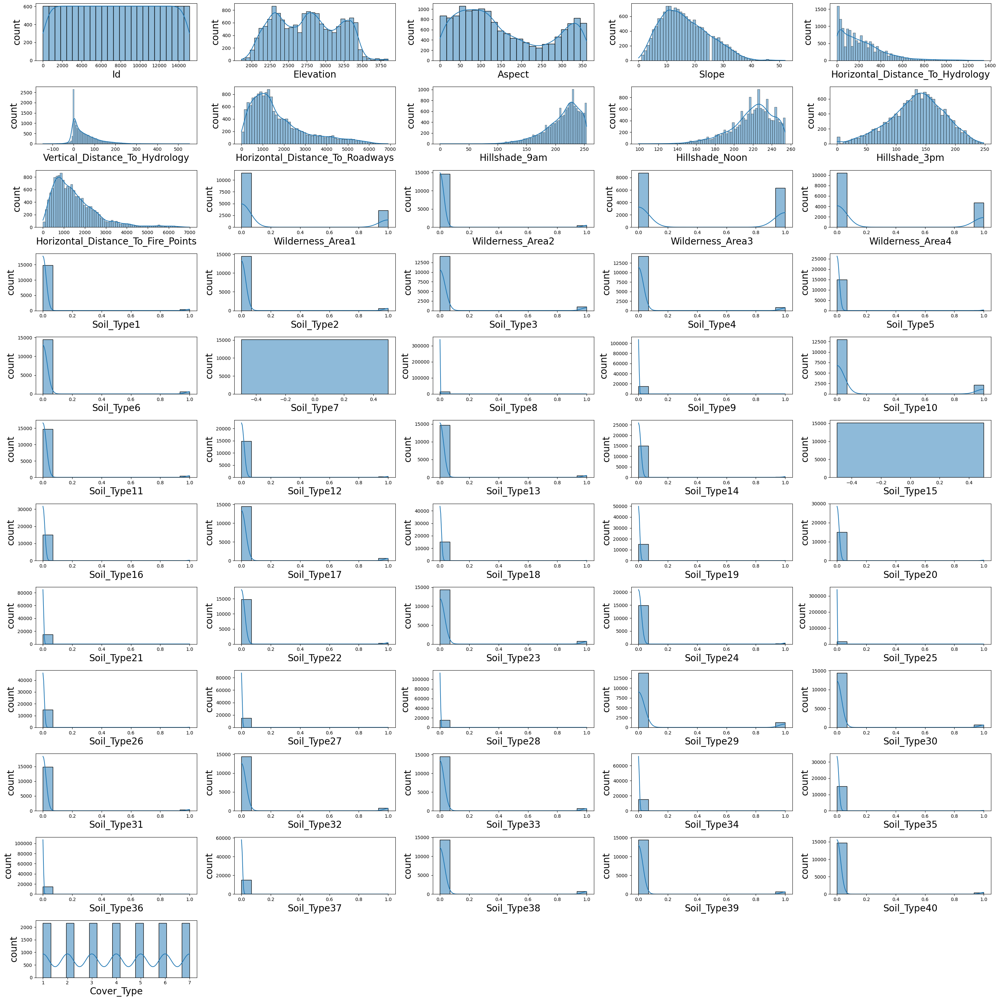

In [16]:
plt.figure(figsize=(30,30),facecolor='white')
plotnumber=1
for column in data:
    if plotnumber <=56:
        ax=plt.subplot(12,5,plotnumber)
        sns.histplot(data[column],kde=True)
        plt.xlabel(column,fontsize=20)
        plt.ylabel('count',fontsize=20)
    plotnumber+=1
plt.tight_layout()
plt.show()

### Bivariate analysis

### Analysis of continous variable with target variable¶

In [17]:
bar=data[['Elevation', 'Aspect', 'Slope',
       'Horizontal_Distance_To_Hydrology', 'Vertical_Distance_To_Hydrology',
       'Horizontal_Distance_To_Roadways', 'Hillshade_9am', 'Hillshade_Noon',
       'Hillshade_3pm', 'Horizontal_Distance_To_Fire_Points']]

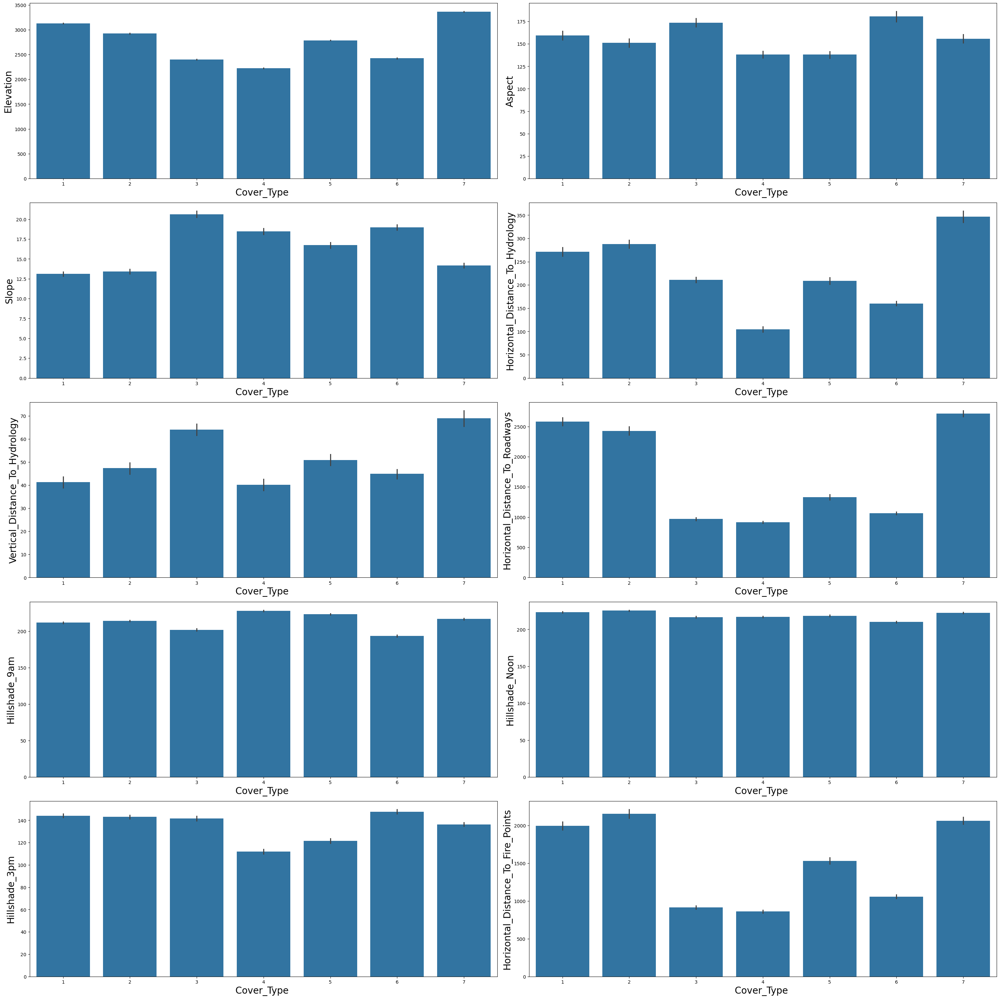

In [19]:
plt.figure(figsize=(30,30),facecolor='white')
plotnumber=1
for column in bar:
    if plotnumber <=10:
        ax=plt.subplot(5,2,plotnumber)
        sns.barplot(x=data.Cover_Type ,y=bar[column])
        plt.xlabel('Cover_Type ',fontsize=20)
        plt.ylabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout()
plt.show()

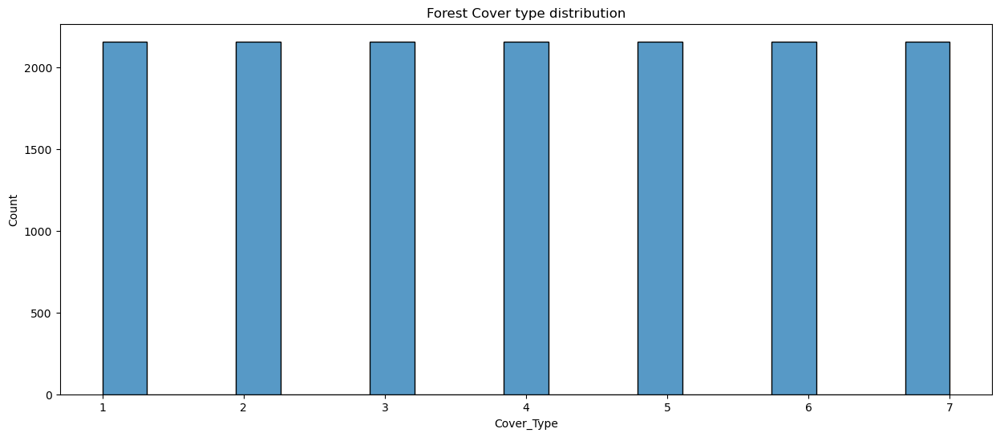

In [20]:
plt.figure(figsize=(15,6))
sns.histplot(data=data,x="Cover_Type",)
plt.title('Forest Cover type distribution')
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

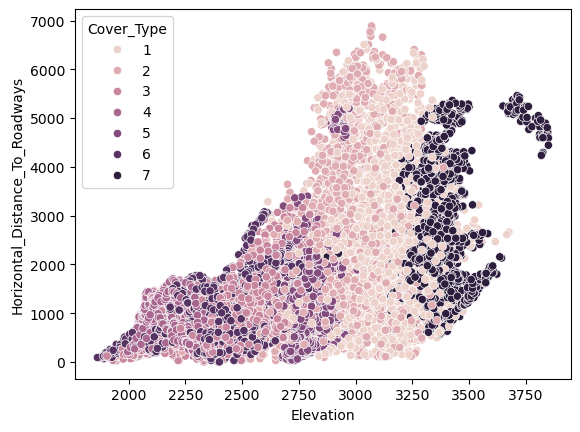

In [22]:
sns.scatterplot(data=data,y='Horizontal_Distance_To_Roadways',x='Elevation',hue='Cover_Type')
plt.show

1) We can see a positive correlaton between Elevation and Distance to Roadways.

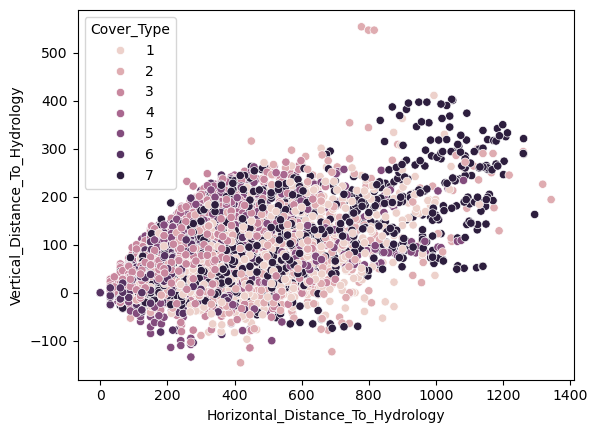

In [23]:
sns.scatterplot (data=data,y='Vertical_Distance_To_Hydrology',x='Horizontal_Distance_To_Hydrology',hue='Cover_Type')
plt.show()

 We can see positive correlation between both the distance to Hydrology.

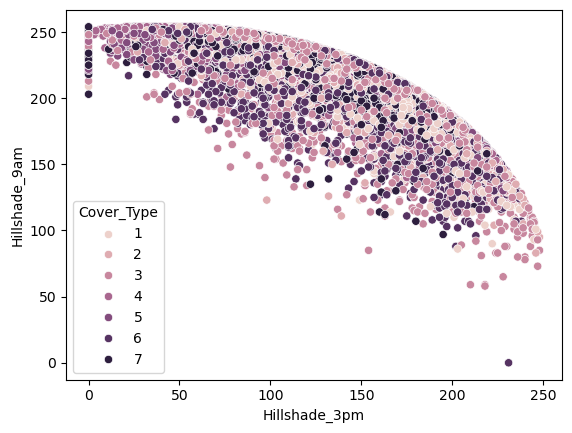

In [24]:
sns.scatterplot (data=data,y='Hillshade_9am',x='Hillshade_3pm',hue='Cover_Type')
plt.show()

 This graph is obvious as the shade at 9 am will be opposite to the shade at 3pm on the    area .

We can see a negative correlation between hillshade index at 9am and 3pm.

In [25]:
import sweetviz as sv
my_rep=sv.analyze(data)
my_rep.show_html()

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [26]:
data['Cover_Type'].value_counts()

Cover_Type
5    2160
2    2160
1    2160
7    2160
3    2160
6    2160
4    2160
Name: count, dtype: int64

In [27]:
data.columns

Index(['Id', 'Elevation', 'Aspect', 'Slope',
       'Horizontal_Distance_To_Hydrology', 'Vertical_Distance_To_Hydrology',
       'Horizontal_Distance_To_Roadways', 'Hillshade_9am', 'Hillshade_Noon',
       'Hillshade_3pm', 'Horizontal_Distance_To_Fire_Points',
       'Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3',
       'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3',
       'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7', 'Soil_Type8',
       'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12',
       'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16',
       'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20',
       'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24',
       'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28',
       'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32',
       'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36',
       'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_

In [29]:
data.iloc[15119]

Id                                    15120
Elevation                              2475
Aspect                                  197
Slope                                    34
Horizontal_Distance_To_Hydrology        319
Vertical_Distance_To_Hydrology           78
Horizontal_Distance_To_Roadways         270
Hillshade_9am                           189
Hillshade_Noon                          244
Hillshade_3pm                           164
Horizontal_Distance_To_Fire_Points      914
Wilderness_Area1                          0
Wilderness_Area2                          0
Wilderness_Area3                          1
Wilderness_Area4                          0
Soil_Type1                                0
Soil_Type2                                1
Soil_Type3                                0
Soil_Type4                                0
Soil_Type5                                0
Soil_Type6                                0
Soil_Type7                                0
Soil_Type8                      

In [31]:
duplicate=data[data.duplicated()]
duplicate

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type


There are no duplicate values in the given dataset

In [32]:
profile=ProfileReport(data,title='EDA',explorative=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## DATA PRE-PROCESSING

In [33]:
data.isnull().sum()

Id                                    0
Elevation                             0
Aspect                                0
Slope                                 0
Horizontal_Distance_To_Hydrology      0
Vertical_Distance_To_Hydrology        0
Horizontal_Distance_To_Roadways       0
Hillshade_9am                         0
Hillshade_Noon                        0
Hillshade_3pm                         0
Horizontal_Distance_To_Fire_Points    0
Wilderness_Area1                      0
Wilderness_Area2                      0
Wilderness_Area3                      0
Wilderness_Area4                      0
Soil_Type1                            0
Soil_Type2                            0
Soil_Type3                            0
Soil_Type4                            0
Soil_Type5                            0
Soil_Type6                            0
Soil_Type7                            0
Soil_Type8                            0
Soil_Type9                            0
Soil_Type10                           0


There are no null values present in the given dataset

### CHECKING OUTLIERS

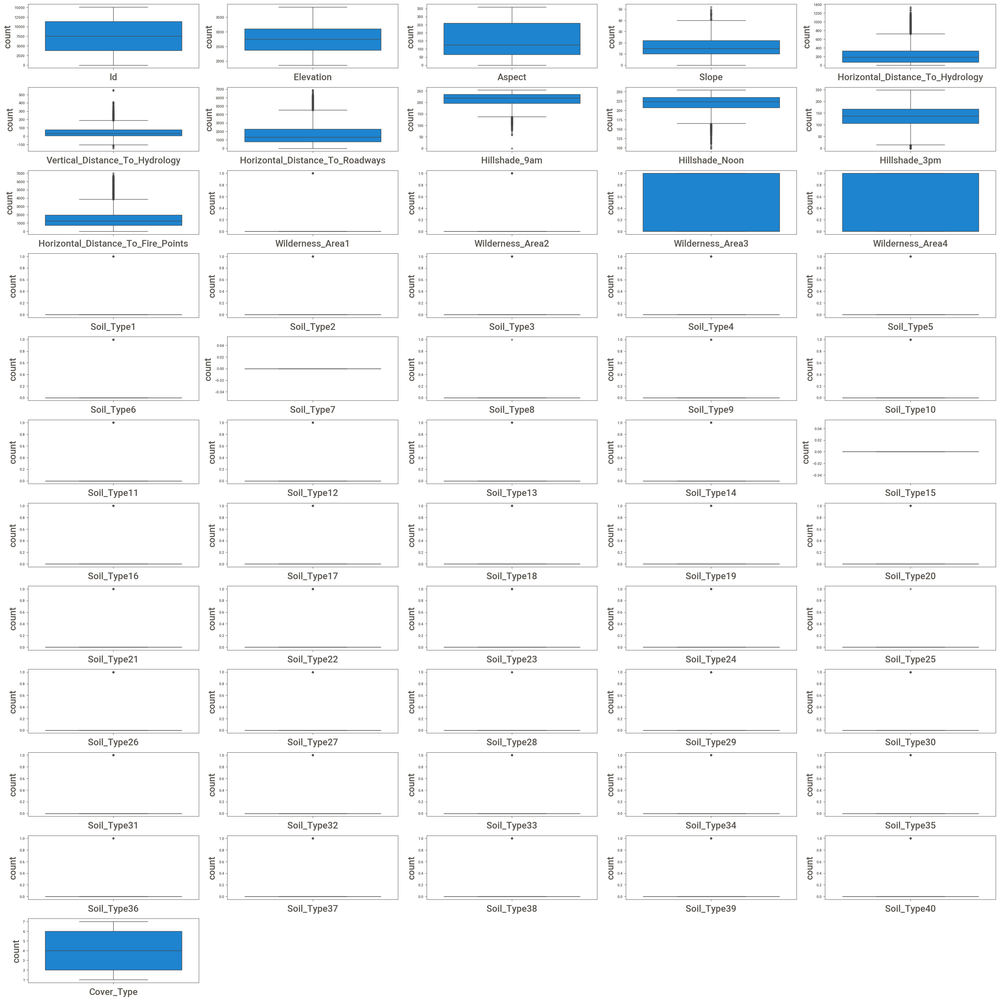

In [36]:
plt.figure(figsize=(30,30),facecolor='white')
plotnumber=1
for column in data:
    if plotnumber<=56:
        ax=plt.subplot(12,5,plotnumber)
        sns.boxplot(data[column])
        plt.xlabel(column,fontsize=20)
        plt.ylabel('count',fontsize=20)
    plotnumber+=1
plt.tight_layout()
plt.show()

## HANDLING OUTLIERS

#### Checking whether the data is in Skewed form or Normal distribution

In [38]:
from scipy.stats import shapiro,normaltest,skew
def check_distribution(column_data,alpha=0.05):
    skewness=skew(column_data)
    stat,p_shapiro=shapiro(column_data)
    stat,p_k2=normaltest(column_data)
    if p_shapiro >alpha and p_k2 > alpha:
        return "Normal"
    else:
        return "Skewed"
results={}
for column in data.columns:
    distribution=check_distribution(data[column])
    results[column]=distribution

print("\nColumn Distribution Results:")
for column, distribution in results.items():
    print(f"{column}:{distribution}")


Column Distribution Results:
Id:Skewed
Elevation:Skewed
Aspect:Skewed
Slope:Skewed
Horizontal_Distance_To_Hydrology:Skewed
Vertical_Distance_To_Hydrology:Skewed
Horizontal_Distance_To_Roadways:Skewed
Hillshade_9am:Skewed
Hillshade_Noon:Skewed
Hillshade_3pm:Skewed
Horizontal_Distance_To_Fire_Points:Skewed
Wilderness_Area1:Skewed
Wilderness_Area2:Skewed
Wilderness_Area3:Skewed
Wilderness_Area4:Skewed
Soil_Type1:Skewed
Soil_Type2:Skewed
Soil_Type3:Skewed
Soil_Type4:Skewed
Soil_Type5:Skewed
Soil_Type6:Skewed
Soil_Type7:Skewed
Soil_Type8:Skewed
Soil_Type9:Skewed
Soil_Type10:Skewed
Soil_Type11:Skewed
Soil_Type12:Skewed
Soil_Type13:Skewed
Soil_Type14:Skewed
Soil_Type15:Skewed
Soil_Type16:Skewed
Soil_Type17:Skewed
Soil_Type18:Skewed
Soil_Type19:Skewed
Soil_Type20:Skewed
Soil_Type21:Skewed
Soil_Type22:Skewed
Soil_Type23:Skewed
Soil_Type24:Skewed
Soil_Type25:Skewed
Soil_Type26:Skewed
Soil_Type27:Skewed
Soil_Type28:Skewed
Soil_Type29:Skewed
Soil_Type30:Skewed
Soil_Type31:Skewed
Soil_Type32:Skewe

In [39]:
def detect_and_capping_outliers(data,column):
    Q1=data[column].quantile(0.25)
    Q3=data[column].quantile(0.75)
    IQR= Q3 - Q1

    lower_bound= Q1 - 1.5 * IQR
    upper_bound= Q3 + 1.5 * IQR 

    data.loc[data[column]< lower_bound,column]=lower_bound
    data.loc[data[column]> upper_bound,column]=upper_bound

    return data

In [40]:
for column in data:
    data= detect_and_capping_outliers(data,column)

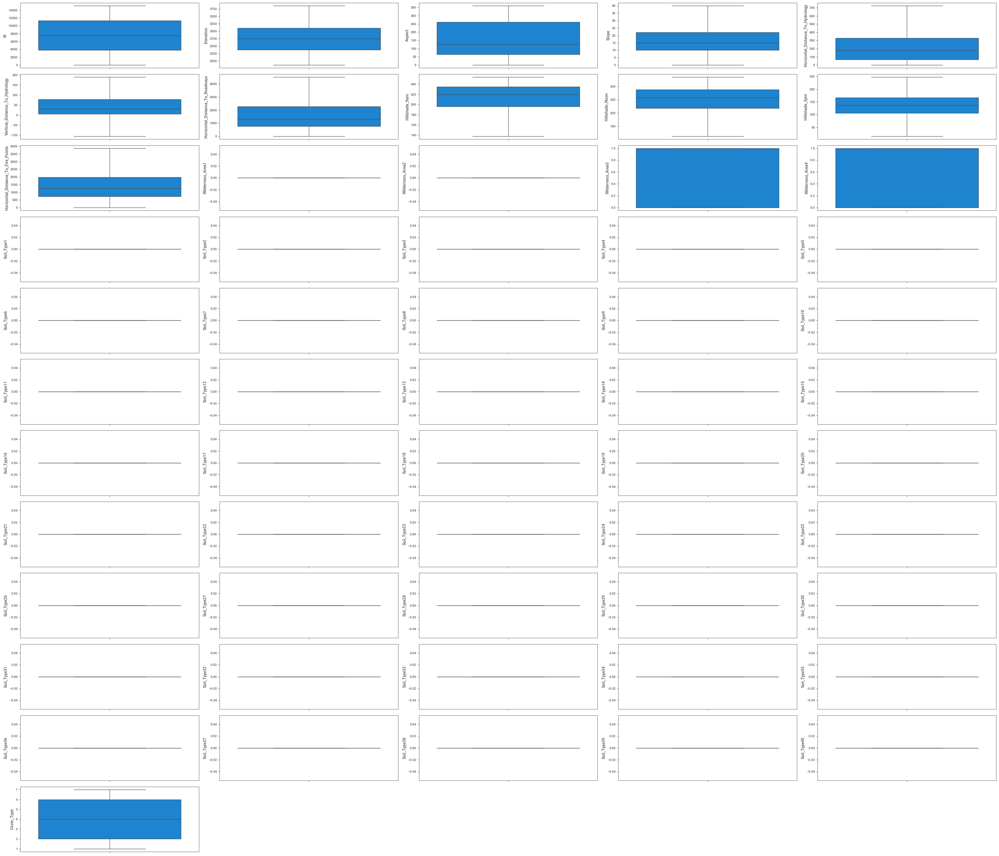

In [41]:
plt.figure(figsize=(35,30),facecolor="white")
plotnumber=1
for column in data:
    if plotnumber<=56 :
        ax=plt.subplot(12,5,plotnumber)
        sns.boxplot(data[column])
 
    plotnumber+=1

plt.tight_layout()

Outliers are handled efficiently.

### ENCODING

In [42]:
numeric_column=[feature for feature in data.columns if data[feature].dtype != "O"]
categorical_column=[feature for feature in data.columns if data[feature].dtype == "O"]

print('We have {} numerical columns : {}'.format(len(numeric_column),numeric_column))
print('\nWe have {} categorical features : {}'.format(len(categorical_column),categorical_column))

We have 56 numerical columns : ['Id', 'Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology', 'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways', 'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm', 'Horizontal_Distance_To_Fire_Points', 'Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40', 'Cover_Type']

We have 0 categorical features : []


There is no need to perform Encoding as all the data has numerical features

### FEATURE SELECTION

In [53]:
data3=data.drop(columns=['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3',
       'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7', 'Soil_Type8',
       'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12',
       'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16',
       'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20',
       'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24',
       'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28',
       'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32',
       'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36',
       'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40','Cover_Type'])

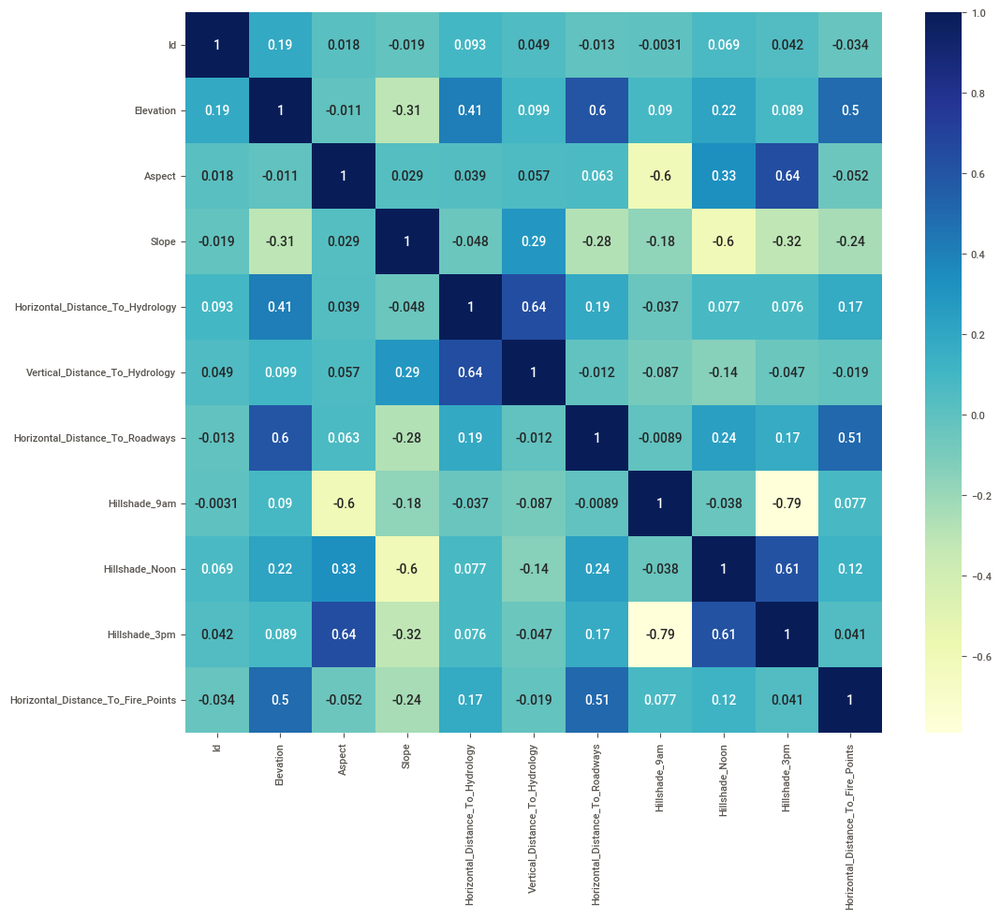

In [54]:
fig=plt.figure(figsize=(12,10))
sns.heatmap(data3.corr(),annot=True ,cmap="YlGnBu")
plt.show()

In [55]:
data3.corr()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points
Id,1.000000,0.185496,0.017702,-0.019229,0.092606,0.049104,-0.012674,-0.003061,0.069335,0.041950,-0.033847
Elevation,0.185496,1.000000,-0.011096,-0.314299,0.407687,0.099165,0.598196,0.089899,0.216347,0.089180,0.495810
Aspect,0.017702,-0.011096,1.000000,0.028775,0.039366,0.056639,0.063136,-0.601753,0.328101,0.637445,-0.052148
Slope,-0.019229,-0.314299,0.028775,1.000000,-0.048482,0.287856,-0.278275,-0.175204,-0.599833,-0.322319,-0.240881
Horizontal_Distance_To_Hydrology,0.092606,0.407687,0.039366,-0.048482,1.000000,0.639864,0.186850,-0.036764,0.076606,0.076385,0.174212
Vertical_Distance_To_Hydrology,0.049104,0.099165,0.056639,0.287856,0.639864,1.000000,-0.012019,-0.087253,-0.143315,-0.047248,-0.018797
Horizontal_Distance_To_Roadways,-0.012674,0.598196,0.063136,-0.278275,0.186850,-0.012019,1.000000,-0.008890,0.243323,0.173190,0.508408
Hillshade_9am,-0.003061,0.089899,-0.601753,-0.175204,-0.036764,-0.087253,-0.008890,1.000000,-0.038099,-0.791884,0.076630
Hillshade_Noon,0.069335,0.216347,0.328101,-0.599833,0.076606,-0.143315,0.243323,-0.038099,1.000000,0.613814,0.119338
Hillshade_3pm,0.041950,0.089180,0.637445,-0.322319,0.076385,-0.047248,0.173190,-0.791884,0.613814,1.000000,0.041454


In [56]:
data3.isnull().sum()

Id                                    0
Elevation                             0
Aspect                                0
Slope                                 0
Horizontal_Distance_To_Hydrology      0
Vertical_Distance_To_Hydrology        0
Horizontal_Distance_To_Roadways       0
Hillshade_9am                         0
Hillshade_Noon                        0
Hillshade_3pm                         0
Horizontal_Distance_To_Fire_Points    0
dtype: int64

### SCALING

In [58]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
dl=['Cover_Type']
data1=sc.fit_transform(data.drop(dl,axis=1))

In [59]:
data1

array([[-1.73193626, -0.36709512, -0.95997982, ...,  0.        ,
         0.        ,  0.        ],
       [-1.73170715, -0.38146072, -0.9145592 , ...,  0.        ,
         0.        ,  0.        ],
       [-1.73147804,  0.1309124 , -0.16057691, ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [ 1.73147804, -0.61609888, -0.20599753, ...,  0.        ,
         0.        ,  0.        ],
       [ 1.73170715, -0.62807021,  0.09377856, ...,  0.        ,
         0.        ,  0.        ],
       [ 1.73193626, -0.65680142,  0.36630228, ...,  0.        ,
         0.        ,  0.        ]])

In [60]:
con_data=data['Cover_Type']
con_data

0        5
1        5
2        2
3        2
4        5
        ..
15115    3
15116    3
15117    3
15118    3
15119    3
Name: Cover_Type, Length: 15120, dtype: int64

In [61]:
type(data1)
data2=pd.DataFrame(data1,columns=['Id', 'Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology', 
                                  'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways', 'Hillshade_9am',
                                  'Hillshade_Noon', 'Hillshade_3pm', 'Horizontal_Distance_To_Fire_Points',
                                  'Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 
                                  'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 
                                  'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 
                                  'Soil_Type12', 'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16',
                                  'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 
                                  'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 
                                  'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31',
                                  'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36',
                                  'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40'])

In [62]:
df=pd.concat([data2,con_data],axis=1)
df

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,-1.731936,-0.367095,-0.959980,-1.605154,0.194797,-0.888374,-0.952145,0.268798,0.583754,0.280811,2.521510,0.0,0.0,-0.850801,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
1,-1.731707,-0.381461,-0.914559,-1.724187,-0.047271,-0.996463,-1.050166,0.234529,0.721929,0.346557,2.521510,0.0,0.0,-0.850801,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
2,-1.731478,0.130912,-0.160577,-0.890958,0.247420,0.282590,1.228819,0.714294,0.860104,-0.004087,2.521510,0.0,0.0,-0.850801,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
3,-1.731249,0.085421,-0.015231,0.180336,0.110600,1.237376,1.155303,0.851369,0.860104,-0.288986,2.521510,0.0,0.0,-0.850801,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
4,-1.731020,-0.369489,-1.014485,-1.724187,-0.357749,-0.906389,-1.049349,0.234529,0.675871,0.324641,2.521510,0.0,0.0,-0.850801,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15115,1.731020,-0.340758,0.784172,0.775500,0.194797,-0.762270,-0.829619,-1.478917,1.458861,1.727217,-0.191900,0.0,0.0,1.175363,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
15116,1.731249,-0.350335,-0.324091,0.299369,2.168174,2.534443,-0.863926,1.228327,0.077114,-0.968358,-0.146914,0.0,0.0,1.175363,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
15117,1.731478,-0.616099,-0.205998,1.013565,0.757867,1.219361,-1.095092,1.262596,0.031056,-1.143680,-0.291288,0.0,0.0,1.175363,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
15118,1.731707,-0.628070,0.093779,1.370663,-0.015697,0.931124,-1.171058,0.542949,0.814046,-0.354731,-0.558065,0.0,0.0,1.175363,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3


## BALANCING 

In [63]:
df['Cover_Type'].value_counts()

Cover_Type
5    2160
2    2160
1    2160
7    2160
3    2160
6    2160
4    2160
Name: count, dtype: int64

The given data is already balanced therefore there is no need to perform balancing

## TRAIN-TEST SPLIT

In [64]:
final_df=df.drop(columns=['Id'])

In [65]:
final_df

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,-0.367095,-0.959980,-1.605154,0.194797,-0.888374,-0.952145,0.268798,0.583754,0.280811,2.521510,0.0,0.0,-0.850801,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
1,-0.381461,-0.914559,-1.724187,-0.047271,-0.996463,-1.050166,0.234529,0.721929,0.346557,2.521510,0.0,0.0,-0.850801,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
2,0.130912,-0.160577,-0.890958,0.247420,0.282590,1.228819,0.714294,0.860104,-0.004087,2.521510,0.0,0.0,-0.850801,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
3,0.085421,-0.015231,0.180336,0.110600,1.237376,1.155303,0.851369,0.860104,-0.288986,2.521510,0.0,0.0,-0.850801,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
4,-0.369489,-1.014485,-1.724187,-0.357749,-0.906389,-1.049349,0.234529,0.675871,0.324641,2.521510,0.0,0.0,-0.850801,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15115,-0.340758,0.784172,0.775500,0.194797,-0.762270,-0.829619,-1.478917,1.458861,1.727217,-0.191900,0.0,0.0,1.175363,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
15116,-0.350335,-0.324091,0.299369,2.168174,2.534443,-0.863926,1.228327,0.077114,-0.968358,-0.146914,0.0,0.0,1.175363,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
15117,-0.616099,-0.205998,1.013565,0.757867,1.219361,-1.095092,1.262596,0.031056,-1.143680,-0.291288,0.0,0.0,1.175363,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
15118,-0.628070,0.093779,1.370663,-0.015697,0.931124,-1.171058,0.542949,0.814046,-0.354731,-0.558065,0.0,0.0,1.175363,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3


In [66]:
x=final_df.iloc[:,:-1]
y=final_df.Cover_Type

In [67]:
x

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40
0,-0.367095,-0.959980,-1.605154,0.194797,-0.888374,-0.952145,0.268798,0.583754,0.280811,2.521510,0.0,0.0,-0.850801,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,-0.381461,-0.914559,-1.724187,-0.047271,-0.996463,-1.050166,0.234529,0.721929,0.346557,2.521510,0.0,0.0,-0.850801,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.130912,-0.160577,-0.890958,0.247420,0.282590,1.228819,0.714294,0.860104,-0.004087,2.521510,0.0,0.0,-0.850801,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.085421,-0.015231,0.180336,0.110600,1.237376,1.155303,0.851369,0.860104,-0.288986,2.521510,0.0,0.0,-0.850801,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,-0.369489,-1.014485,-1.724187,-0.357749,-0.906389,-1.049349,0.234529,0.675871,0.324641,2.521510,0.0,0.0,-0.850801,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15115,-0.340758,0.784172,0.775500,0.194797,-0.762270,-0.829619,-1.478917,1.458861,1.727217,-0.191900,0.0,0.0,1.175363,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
15116,-0.350335,-0.324091,0.299369,2.168174,2.534443,-0.863926,1.228327,0.077114,-0.968358,-0.146914,0.0,0.0,1.175363,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
15117,-0.616099,-0.205998,1.013565,0.757867,1.219361,-1.095092,1.262596,0.031056,-1.143680,-0.291288,0.0,0.0,1.175363,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
15118,-0.628070,0.093779,1.370663,-0.015697,0.931124,-1.171058,0.542949,0.814046,-0.354731,-0.558065,0.0,0.0,1.175363,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [68]:
y

0        5
1        5
2        2
3        2
4        5
        ..
15115    3
15116    3
15117    3
15118    3
15119    3
Name: Cover_Type, Length: 15120, dtype: int64

In [69]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.25,random_state=42)

In [70]:
x_train.shape

(11340, 54)

In [71]:
y_train.shape

(11340,)

In [72]:
x_test.shape

(3780, 54)

In [73]:
y_test.shape

(3780,)

## MODEL CREATION

### ALGORITHMS APPLIED 

1.LOGISTIC REGRESSION

2.SUPPORT VECTOR MACHINE

3.RANDOM FOREST CLASSIFIER

4.DECISION TREE CLASSIFIER

5.K-NEAREST NEIGHBORS(KNN)

6.ARTIFICIAL NEURAL NETWORK(ANN)

7.GAUSSIAN NAIVE BAYES

8.GRADIENT BOOSTING

## 1. LOGISTIC REGRESSION

Logistic Regression is statistical and machine learning method used for binary classification problems.
It uses the sigmoid function or logistic function to map predictions to probablities. Based on a predefined threshold,these probablities are converted into class predictions.                                                                  

In [74]:
from sklearn.linear_model import LogisticRegression
lr_multi=LogisticRegression()
lr_multi.fit(x_train,y_train)

LogisticRegression()

In [75]:
y_pred=lr_multi.predict(x_test)
y_pred

array([4, 6, 7, ..., 5, 1, 5], dtype=int64)

In [76]:
y_pred_prob=lr_multi.predict_proba(x_test)
y_pred_prob

array([[1.26825092e-05, 4.10006984e-03, 2.02922486e-01, ...,
        9.15691383e-04, 8.94751744e-02, 3.10462840e-09],
       [2.41870965e-03, 4.83835324e-02, 3.12924253e-01, ...,
        2.12114495e-01, 4.23392537e-01, 3.78711749e-07],
       [6.98172811e-02, 5.14501736e-04, 9.78124299e-15, ...,
        1.68486630e-06, 7.18002428e-14, 9.29666532e-01],
       ...,
       [3.55971106e-03, 2.24864971e-01, 2.39631706e-02, ...,
        6.87761406e-01, 5.80556320e-02, 6.91949114e-09],
       [5.47259813e-01, 1.63481556e-01, 1.22373363e-06, ...,
        2.63025686e-01, 2.09939013e-06, 2.62296210e-02],
       [3.48596318e-02, 1.75733278e-01, 1.27651458e-01, ...,
        4.07108852e-01, 2.54629424e-01, 1.61313056e-05]])

#### EVALUATION OF MODEL

In [77]:
from sklearn.metrics import confusion_matrix,accuracy_score,recall_score,precision_score,classification_report,f1_score

In [78]:
cm=confusion_matrix(y_test,y_pred)
print(cm)

[[327  81   0   0  31   0  81]
 [136 265  12   0 118  18  11]
 [  0   0 263  95  20 158   0]
 [  0   0  47 476   0  29   0]
 [  1  86   7   0 419  14   0]
 [  0   2 109  76  30 314   0]
 [ 65   0   0   0   2   0 487]]


In [79]:
recall=recall_score(y_test,y_pred,average='weighted')
recall

0.6748677248677248

In [80]:
accuracy=accuracy_score(y_test,y_pred)
accuracy

0.6748677248677248

In [81]:
precision=precision_score(y_test,y_pred,average='micro')
precision

0.6748677248677248

In [82]:
f1score=f1_score(y_test,y_pred,average='micro')
f1score

0.6748677248677248

In [83]:
cr=classification_report(y_test,y_pred)
print(cr)

              precision    recall  f1-score   support

           1       0.62      0.63      0.62       520
           2       0.61      0.47      0.53       560
           3       0.60      0.49      0.54       536
           4       0.74      0.86      0.79       552
           5       0.68      0.80      0.73       527
           6       0.59      0.59      0.59       531
           7       0.84      0.88      0.86       554

    accuracy                           0.67      3780
   macro avg       0.67      0.67      0.67      3780
weighted avg       0.67      0.67      0.67      3780



### Bagging using Logistic Regression

In [84]:
from sklearn.ensemble import BaggingClassifier

model_bagg=BaggingClassifier(estimator=lr_multi,n_estimators=20)

model_bagg.fit(x_train,y_train)

y_hat_bagg=model_bagg.predict(x_test)

In [85]:
y_train_bagg=model_bagg.predict(x_train)
f1_train_bagg=f1_score(y_train,y_train_bagg,average='weighted')
f1_train_bagg

0.6746711201731165

In [86]:
f1_bagg_LR=f1_score(y_test,y_hat_bagg,average='weighted')
f1_bagg_LR

0.6701753220546712

In [87]:
ac_LR_bag=accuracy_score(y_test,y_hat_bagg)
ac_LR_bag

0.6767195767195767

In [88]:
print(classification_report(y_test,y_hat_bagg))

              precision    recall  f1-score   support

           1       0.62      0.63      0.63       520
           2       0.61      0.48      0.53       560
           3       0.60      0.50      0.54       536
           4       0.74      0.86      0.80       552
           5       0.68      0.79      0.73       527
           6       0.59      0.59      0.59       531
           7       0.84      0.88      0.86       554

    accuracy                           0.68      3780
   macro avg       0.67      0.68      0.67      3780
weighted avg       0.67      0.68      0.67      3780



### 2) SVM

SUPPORT VECTOR MACHINE is a supervised machine learning algorithm used both for classification and regression tasks,but is primarily used for classification tasks. SVM works by finding the optimal hyperplane that best seperates the data pounts of different classes in a high-dimensional space.

In [89]:
from sklearn.svm import SVC
svclass=SVC()
svclass.fit(x_train,y_train)

SVC()

In [90]:
y_hat=svclass.predict(x_test)
y_hat

array([4, 3, 1, ..., 2, 5, 2], dtype=int64)

#### EVALUATION OF MODEL

In [92]:
acc=accuracy_score(y_test,y_hat)
acc

0.7621693121693122

In [93]:
rec=recall_score(y_test,y_hat,average='weighted')
rec

0.7621693121693122

In [94]:
prec=precision_score(y_test,y_hat,average='micro')
prec

0.7621693121693122

In [95]:
f1=f1_score(y_test,y_hat,average='micro')
f1

0.7621693121693122

In [96]:
cm=confusion_matrix(y_test,y_hat)
cm

array([[345,  79,   0,   0,  21,   2,  73],
       [117, 318,  20,   0,  78,  18,   9],
       [  0,   0, 338,  70,  14, 114,   0],
       [  0,   0,  12, 535,   0,   5,   0],
       [  0,  30,  18,   0, 470,   9,   0],
       [  0,   4,  94,  61,  12, 360,   0],
       [ 37,   0,   0,   0,   2,   0, 515]], dtype=int64)

In [97]:
cross_tab=pd.crosstab(y_test,y_hat)
cross_tab

col_0,1,2,3,4,5,6,7
Cover_Type,,,,,,,
1,345,79,0,0,21,2,73
2,117,318,20,0,78,18,9
3,0,0,338,70,14,114,0
4,0,0,12,535,0,5,0
5,0,30,18,0,470,9,0
6,0,4,94,61,12,360,0
7,37,0,0,0,2,0,515


In [100]:
from sklearn.ensemble import BaggingClassifier

svm_bag=BaggingClassifier(estimator=svclass,n_estimators=20)

svm_bag.fit(x_train,y_train)

svm_y_hat_bag=svm_bag.predict(x_test)

In [102]:
print(classification_report(y_test,svm_y_hat_bag))

              precision    recall  f1-score   support

           1       0.69      0.67      0.68       520
           2       0.73      0.57      0.64       560
           3       0.68      0.62      0.65       536
           4       0.80      0.97      0.88       552
           5       0.79      0.88      0.84       527
           6       0.70      0.66      0.68       531
           7       0.86      0.93      0.89       554

    accuracy                           0.76      3780
   macro avg       0.75      0.76      0.75      3780
weighted avg       0.75      0.76      0.75      3780



### 3) RANDOM FOREST CLASSIFIER

RANDOM FOREST CLASSIFIER is a powerful supervised machine learning algorithm. It is an 
ensemble meachine learning method tat builds multiple decision trees during training and combines their outputs to improve the model's accuracy and robustness.

In [103]:
from sklearn.ensemble import RandomForestClassifier
RF=RandomForestClassifier(n_estimators=100)
RF.fit(x_train,y_train)

RandomForestClassifier()

In [104]:
y_predic=RF.predict(x_test)
y_predic

array([6, 3, 1, ..., 2, 1, 5], dtype=int64)

In [105]:
print(classification_report(y_test,y_predic))

              precision    recall  f1-score   support

           1       0.73      0.74      0.74       520
           2       0.80      0.64      0.71       560
           3       0.81      0.80      0.81       536
           4       0.91      0.98      0.94       552
           5       0.86      0.95      0.90       527
           6       0.83      0.82      0.83       531
           7       0.91      0.96      0.93       554

    accuracy                           0.84      3780
   macro avg       0.84      0.84      0.84      3780
weighted avg       0.84      0.84      0.84      3780



#### By Using Bagging Technique

In [106]:
rand_bagg=BaggingClassifier(estimator=RF,n_estimators=20)
 
rand_bagg.fit(x_train,y_train)

y_hat_bagg=rand_bagg.predict(x_test)

In [107]:
print(classification_report(y_test,y_hat_bagg))

              precision    recall  f1-score   support

           1       0.72      0.71      0.72       520
           2       0.80      0.61      0.70       560
           3       0.81      0.77      0.79       536
           4       0.89      0.97      0.93       552
           5       0.84      0.94      0.89       527
           6       0.80      0.80      0.80       531
           7       0.89      0.97      0.92       554

    accuracy                           0.83      3780
   macro avg       0.82      0.83      0.82      3780
weighted avg       0.82      0.83      0.82      3780



### 4.DECISION TREE CLASSIFIER

DECISION TREE CLASSIFIER is a supervised machine learning algorithm used for both classification and regression tasks. It works by breaking down a dataset into smaller subsets while simultaneously building an assiociated tree structure.

In [108]:
from sklearn.tree import DecisionTreeClassifier 
DTC=DecisionTreeClassifier()
DTC.fit(x_train,y_train)

DecisionTreeClassifier()

In [109]:
y_p=DTC.predict(x_test)
y_p

array([6, 5, 1, ..., 2, 1, 2], dtype=int64)

In [110]:
y_test_predict=DTC.predict(x_test)
y_test_predict

array([6, 5, 1, ..., 2, 1, 2], dtype=int64)

In [111]:
print(classification_report(y_test,y_test_predict))

              precision    recall  f1-score   support

           1       0.63      0.64      0.64       520
           2       0.61      0.55      0.58       560
           3       0.71      0.71      0.71       536
           4       0.89      0.93      0.91       552
           5       0.82      0.85      0.83       527
           6       0.73      0.71      0.72       531
           7       0.89      0.91      0.90       554

    accuracy                           0.76      3780
   macro avg       0.75      0.76      0.76      3780
weighted avg       0.75      0.76      0.76      3780



#### BY USING BAGGING

In [112]:
dec_bagg=BaggingClassifier(estimator=DTC,n_estimators=20)
dec_bagg.fit(x_train,y_train)
y_hat_bagg=dec_bagg.predict(x_test)

In [113]:
print(classification_report(y_test,y_hat_bagg))

              precision    recall  f1-score   support

           1       0.71      0.74      0.73       520
           2       0.78      0.59      0.67       560
           3       0.80      0.79      0.79       536
           4       0.92      0.97      0.94       552
           5       0.85      0.93      0.89       527
           6       0.82      0.82      0.82       531
           7       0.90      0.95      0.92       554

    accuracy                           0.83      3780
   macro avg       0.82      0.83      0.82      3780
weighted avg       0.83      0.83      0.82      3780



### 5.KNN (K-Nearest Neighbours)

KNN (K-Nearest Neighbours) is a simple, non-parametric, and versatile supervised machine learning method. It is based in the principle of proximity,where predictions for a given data point are made by analyzing the nearest k points in the feature space.

In [114]:
from sklearn.neighbors import KNeighborsClassifier
error_rate = []
for i in range(1,11):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(x_train,y_train)
    pred_i = knn.predict(x_test)
    error_rate.append(np.mean(pred_i != y_test))

In [115]:
error_rate

[0.2246031746031746,
 0.2574074074074074,
 0.2402116402116402,
 0.24708994708994708,
 0.2462962962962963,
 0.25502645502645505,
 0.25105820105820104,
 0.2611111111111111,
 0.26296296296296295,
 0.26666666666666666]

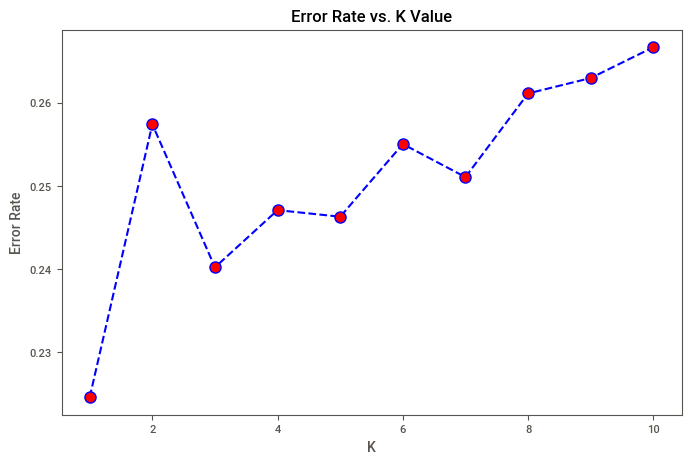

In [116]:
plt.figure(figsize=(8,5))
plt.plot(range(1,11),error_rate,color='blue', linestyle='dashed', 
         marker='o',markerfacecolor='red', markersize=8)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
plt.show()

In [117]:
KNN=KNeighborsClassifier(n_neighbors=4)
KNN.fit(x_train,y_train)

KNeighborsClassifier(n_neighbors=4)

In [118]:
y_pred=KNN.predict(x_test)
y_pred

array([3, 3, 1, ..., 2, 5, 5], dtype=int64)

In [120]:
accu=accuracy_score(y_test,y_pred)
accu

0.7529100529100529

In [121]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           1       0.63      0.69      0.66       520
           2       0.69      0.50      0.58       560
           3       0.67      0.68      0.68       536
           4       0.83      0.95      0.89       552
           5       0.79      0.90      0.84       527
           6       0.74      0.65      0.69       531
           7       0.88      0.90      0.89       554

    accuracy                           0.75      3780
   macro avg       0.75      0.75      0.75      3780
weighted avg       0.75      0.75      0.75      3780



#### By Using Bagging


In [122]:
knn_bagg=BaggingClassifier(estimator=KNN,n_estimators=20)
knn_bagg.fit(x_train,y_train)
y_hat_bagg=knn_bagg.predict(x_test)

In [123]:
print(classification_report(y_test,y_hat_bagg))

              precision    recall  f1-score   support

           1       0.68      0.61      0.64       520
           2       0.70      0.51      0.59       560
           3       0.72      0.61      0.66       536
           4       0.82      0.97      0.89       552
           5       0.76      0.93      0.84       527
           6       0.73      0.75      0.74       531
           7       0.85      0.94      0.90       554

    accuracy                           0.76      3780
   macro avg       0.75      0.76      0.75      3780
weighted avg       0.75      0.76      0.75      3780



## 6.ANN (Artificial Neural Network)

ANN (Artificial Neural Network) is a computational model inspired by the structure and function of human brain. It is a key component of Deep learning and is widely used to solve complex machine learning problems including classification,regression and pattern recognition.

In [124]:
from sklearn.neural_network import MLPClassifier
ANN=MLPClassifier( hidden_layer_sizes=(200,50),
                       learning_rate_init=0.01,
                       max_iter=100,
                       random_state=42)
ANN.fit(x_train,y_train)


MLPClassifier(hidden_layer_sizes=(200, 50), learning_rate_init=0.01,
              max_iter=100, random_state=42)

In [125]:
y_pred=ANN.predict(x_test)
y_pred

array([6, 3, 1, ..., 2, 1, 5], dtype=int64)

In [126]:
accuracy=accuracy_score(y_test,y_pred)
accuracy

0.8206349206349206

In [127]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           1       0.69      0.73      0.71       520
           2       0.73      0.62      0.67       560
           3       0.81      0.74      0.77       536
           4       0.92      0.98      0.95       552
           5       0.87      0.93      0.90       527
           6       0.79      0.82      0.80       531
           7       0.93      0.92      0.92       554

    accuracy                           0.82      3780
   macro avg       0.82      0.82      0.82      3780
weighted avg       0.82      0.82      0.82      3780



In [128]:
pd.crosstab(y_test,y_pred)

col_0,1,2,3,4,5,6,7
Cover_Type,,,,,,,
1,382,94,0,0,12,0,32
2,130,349,14,0,48,13,6
3,0,6,396,32,7,95,0
4,0,0,5,541,0,6,0
5,6,16,12,0,489,4,0
6,1,4,64,18,7,437,0
7,37,9,0,0,0,0,508


#### By Using Bagging

In [130]:
ann_bagg=BaggingClassifier(estimator=ANN,n_estimators=20)
ann_bagg.fit(x_train,y_train)
y_hat_bagg=ann_bagg.predict(x_test)

In [131]:
print(classification_report(y_test,y_hat_bagg))

              precision    recall  f1-score   support

           1       0.76      0.74      0.75       520
           2       0.76      0.68      0.72       560
           3       0.80      0.83      0.81       536
           4       0.93      0.97      0.95       552
           5       0.88      0.94      0.91       527
           6       0.85      0.83      0.84       531
           7       0.93      0.96      0.95       554

    accuracy                           0.85      3780
   macro avg       0.85      0.85      0.85      3780
weighted avg       0.85      0.85      0.85      3780



### 7. GAUSSIAN NAIVE BAYES

GAUSSIAN NAIVE BAYES Classifier is a probablistic machine learning algorithm bases on bayes thereom.It is a variant of the naive bayes algorithm specifically designed for continous data, where the likelihood of the features is assumed to follow a guassian distribution.

In [132]:
from sklearn.naive_bayes import GaussianNB
GNB=GaussianNB(var_smoothing=1e-09)
GNB.fit(x_train,y_train)


GaussianNB()

In [133]:
y_predict=GNB.predict(x_test)
y_predict

array([4, 5, 7, ..., 1, 5, 5], dtype=int64)

In [134]:
accuracy=accuracy_score(y_test,y_predict)
accuracy

0.4886243386243386

In [135]:
print(classification_report(y_test,y_predict))

              precision    recall  f1-score   support

           1       0.44      0.67      0.53       520
           2       0.00      0.00      0.00       560
           3       0.50      0.00      0.00       536
           4       0.47      1.00      0.64       552
           5       0.40      0.90      0.55       527
           6       1.00      0.01      0.02       531
           7       0.77      0.84      0.80       554

    accuracy                           0.49      3780
   macro avg       0.51      0.49      0.36      3780
weighted avg       0.51      0.49      0.36      3780



### 8.GRADIENT BOOSTING

GRADIENT BOOSTING is a part of ensemble methods and works by combining the predictions of multiple weak learners to build a strong predictive model. GRADIENT BOOSTING focuses on correcting the errors of previous model iteratively, resulting in higher accurate predictions.

In [136]:
from sklearn.ensemble import GradientBoostingClassifier
gra_boo=GradientBoostingClassifier(n_estimators=100,
                                  learning_rate=0.1,random_state=42)
gra_boo.fit(x_train,y_train)


GradientBoostingClassifier(random_state=42)

In [137]:
y_hat=gra_boo.predict(x_test)
y_hat

array([3, 3, 1, ..., 2, 1, 5], dtype=int64)

In [138]:
print(classification_report(y_test,y_hat))

              precision    recall  f1-score   support

           1       0.67      0.68      0.67       520
           2       0.73      0.55      0.63       560
           3       0.74      0.69      0.71       536
           4       0.89      0.96      0.92       552
           5       0.77      0.89      0.82       527
           6       0.74      0.74      0.74       531
           7       0.87      0.92      0.89       554

    accuracy                           0.78      3780
   macro avg       0.77      0.78      0.77      3780
weighted avg       0.77      0.78      0.77      3780



In [139]:
final_df

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,-0.367095,-0.959980,-1.605154,0.194797,-0.888374,-0.952145,0.268798,0.583754,0.280811,2.521510,0.0,0.0,-0.850801,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
1,-0.381461,-0.914559,-1.724187,-0.047271,-0.996463,-1.050166,0.234529,0.721929,0.346557,2.521510,0.0,0.0,-0.850801,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
2,0.130912,-0.160577,-0.890958,0.247420,0.282590,1.228819,0.714294,0.860104,-0.004087,2.521510,0.0,0.0,-0.850801,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
3,0.085421,-0.015231,0.180336,0.110600,1.237376,1.155303,0.851369,0.860104,-0.288986,2.521510,0.0,0.0,-0.850801,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
4,-0.369489,-1.014485,-1.724187,-0.357749,-0.906389,-1.049349,0.234529,0.675871,0.324641,2.521510,0.0,0.0,-0.850801,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15115,-0.340758,0.784172,0.775500,0.194797,-0.762270,-0.829619,-1.478917,1.458861,1.727217,-0.191900,0.0,0.0,1.175363,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
15116,-0.350335,-0.324091,0.299369,2.168174,2.534443,-0.863926,1.228327,0.077114,-0.968358,-0.146914,0.0,0.0,1.175363,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
15117,-0.616099,-0.205998,1.013565,0.757867,1.219361,-1.095092,1.262596,0.031056,-1.143680,-0.291288,0.0,0.0,1.175363,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
15118,-0.628070,0.093779,1.370663,-0.015697,0.931124,-1.171058,0.542949,0.814046,-0.354731,-0.558065,0.0,0.0,1.175363,-0.669016,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3


### TESTING EFFICIENCY OF THE MODEL 

Since the best accuracy is shown by the ANN model we will use that model for prediction of forest cover type 

In [140]:
input_data=(-0.656801,	0.366302,	2.084859,	0.515800,	0.516783,	-1.148187,	-0.827807,	1.136453,	0.631455,	-0.576896,	0.0,	0.0,	1.175363,	-0.669016,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,
            0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,
            0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0	)
input_data_as_numpy_array=np.asarray(input_data)
input_data_reshaped=input_data_as_numpy_array.reshape(1,-1)
prediction=ANN.predict(input_data_reshaped)
print(prediction)

[3]


In [141]:
input_data=(-0.367095,	-0.959980,	-1.605154,	0.194797,	-0.888374	,-0.952145,	0.268798,
0.583754,	0.280811,	2.521510,	0.0,	0.0,	-0.850801,	-0.669016,	0.0,	0.0,	0.0,
0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,0.0	,0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	
0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,	0.0,		)
input_data_as_numpy_array=np.asarray(input_data)
input_data_reshaped=input_data_as_numpy_array.reshape(1,-1)
prediction=ANN.predict(input_data_reshaped)
print(prediction)

[5]


### Best Model

ANN (Artificial Neural Network) seems like the best choice due to its high accuracy and performance .
After testing according to the result output it has given accurate and precise predictions 

### Challenges Faced

# Data Analysis Report

- **In this  dataset  various attributes related to geographical and environmental factors,**
specifically **covering elevation**,**aspect**,  **slope**, **distance to hydrology**, **fire points**, and **soil types**, among others.

- **The goal of the project is to build a predictive model that can classify the land cover type (Cover_Type)**
**in a given area of the forest based on the given features.**


#### 1. Data Summary

- **Number of Records:** 15,120 (the count for all variables is the same)
- **Variables:** 55 variables, including the target variable Cover_Type.
- **Target Variable:** Cover_Type (ranging from 1 to 7)

#### 2.From data visualization tools like seaborn and matplotlib gained important information.

#### 3. Statistical report 

   1) Minimum elevation is  2749.3 and maximum elevation is 3849.0

    
   2) Vertical_Distance_To_Hydrology includes negative values,
     implying water sources at higher elevations relative to some locations.
     
   3) Outliers: Negative values in Vertical_Distance_To_Hydrology and large ranges in distances suggest the presence of outliers or extreme values.
   
   4) Most soil types have very low mean (close to 0)

 #### Feature selection

#### 5.Outlier

#### 6)Best model

**ANN** (Artificial Neural Network) seems like the best choice due to its high accuracy and performance .
After testing according to the result output it has given accurate and precise predictions.